In [ ]:
##########################  Introduction    ###################

#In this project, we aim to build and evaluate predictive models for churn prediction
#using classification algorithms such as Decision Tree and Naïve Bayes. 
#The dataset has been prepared and preprocessed, including handling missing values, encoding categorical variables,
#and splitting the data into training and testing sets.
# Our goal is to predict the churn status of customers based on various features provided in the dataset.

In [1]:
#####################     Data preparation  ###################

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from scipy.io import arff



from scipy.io import arff
!pip install ydata-profiling
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [7]:
import pandas as pd
from scipy.io import arff

data_file = "churn.arff"

# Load ARFF file
data, meta = arff.loadarff(data_file)

# Convert data to DataFrame
df = pd.DataFrame(data)

# Decode object columns if needed
for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].str.decode('utf-8')

# Look at loaded data and data types
print(df.dtypes)


State                            object
Account Length                  float64
Area Code                        object
Phone Number                     object
Inter Plan                       object
VoiceMail Plan                   object
No of Vmail Mesgs               float64
Total Day Min                   float64
Total Day calls                 float64
Total Day Charge                float64
Total Evening Min               float64
Total Evening Calls             float64
Total Evening Charge            float64
Total Night Minutes             float64
Total Night Calls               float64
Total Night Charge              float64
Total Int Min                   float64
Total Int Calls                 float64
Total Int Charge                float64
No of Calls Customer Service    float64
Churn                            object
dtype: object


In [8]:
# Display the first few rows of the DataFrame
df.head(10)

,State,Account Length,Area Code,Phone Number,Inter Plan,VoiceMail Plan,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,...,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Churn
0,OH,107.0,A415,371-7191,no,yes,26.0,161.6,123.0,27.47,...,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,FALSE
1,NJ,137.0,A415,358-1921,no,no,0.0,243.4,114.0,41.38,...,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,FALSE
2,OH,84.0,A408,375-9999,yes,no,0.0,299.4,71.0,50.90,...,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,FALSE
3,OK,75.0,A415,330-6626,yes,no,0.0,166.7,113.0,28.34,...,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,FALSE
4,AL,118.0,A510,391-8027,yes,no,0.0,223.4,98.0,37.98,...,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,FALSE
5,MA,121.0,A510,355-9993,no,yes,24.0,218.2,88.0,37.09,...,108.0,29.62,212.6,118.0,9.57,7.5,7.0,2.03,3.0,FALSE
6,MO,147.0,A415,329-9001,yes,no,0.0,157.0,79.0,26.69,...,94.0,8.76,211.8,96.0,9.53,7.1,6.0,1.92,0.0,FALSE
7,LA,117.0,A408,335-4719,no,no,0.0,184.5,97.0,31.37,...,80.0,29.89,215.8,90.0,9.71,8.7,4.0,2.35,1.0,FALSE
8,WV,141.0,A415,330-8173,yes,yes,37.0,258.6,84.0,43.96,...,111.0,18.87,326.4,97.0,14.69,11.2,5.0,3.02,0.0,FALSE
9,IN,65.0,A415,329-6603,no,no,0.0,129.1,137.0,21.95,...,83.0,19.42,208.8,111.0,9.40,12.7,6.0,3.43,4.0,TRUE


In [9]:
# look at meta information about data, such as null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   State                         3333 non-null   object 
 1   Account Length                3333 non-null   float64
 2   Area Code                     3333 non-null   object 
 3   Phone Number                  3333 non-null   object 
 4   Inter Plan                    3333 non-null   object 
 5   VoiceMail Plan                3333 non-null   object 
 6   No of Vmail Mesgs             3333 non-null   float64
 7   Total Day Min                 3333 non-null   float64
 8   Total Day calls               3333 non-null   float64
 9   Total Day Charge              3333 non-null   float64
 10  Total Evening Min             3333 non-null   float64
 11  Total Evening Calls           3333 non-null   float64
 12  Total Evening Charge          3333 non-null   float64
 13  Tot

In [10]:
# Find max, min, mean and standard deviation of attributes.

df.describe()

,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [11]:
df.shape

(3333, 21)

In [12]:
column_names = df.columns
column_names

Index(['State', 'Account Length', 'Area Code', 'Phone Number', 'Inter Plan',
       'VoiceMail Plan', 'No of Vmail Mesgs', 'Total Day Min',
       'Total Day calls', 'Total Day Charge', 'Total Evening Min',
       'Total Evening Calls', 'Total Evening Charge', 'Total Night Minutes',
       'Total Night Calls', 'Total Night Charge', 'Total Int Min',
       'Total Int Calls', 'Total Int Charge', 'No of Calls Customer Service',
       'Churn'],
      dtype='object')

In [13]:
# Finding missing values 

df.isnull().sum()

State                           0
Account Length                  0
Area Code                       0
Phone Number                    0
Inter Plan                      0
VoiceMail Plan                  0
No of Vmail Mesgs               0
Total Day Min                   0
Total Day calls                 0
Total Day Charge                0
Total Evening Min               0
Total Evening Calls             0
Total Evening Charge            0
Total Night Minutes             0
Total Night Calls               0
Total Night Charge              0
Total Int Min                   0
Total Int Calls                 0
Total Int Charge                0
No of Calls Customer Service    0
Churn                           0
dtype: int64

In [14]:
# Handle duplicates

print(df.drop_duplicates(inplace=True))

None


In [15]:
# Identify numerical variables

numeric_variables = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Print the list of numerical variables

print("Numerical Variables:")
print(numeric_variables)

Numerical Variables:
['Account Length', 'No of Vmail Mesgs', 'Total Day Min', 'Total Day calls', 'Total Day Charge', 'Total Evening Min', 'Total Evening Calls', 'Total Evening Charge', 'Total Night Minutes', 'Total Night Calls', 'Total Night Charge', 'Total Int Min', 'Total Int Calls', 'Total Int Charge', 'No of Calls Customer Service']


In [16]:
# Identify categorical variables

categorical_variables = df.select_dtypes(include=['object']).columns.tolist()

# Print the list of categorical variables

print("Categorical Variables:")
print(categorical_variables)


Categorical Variables:
['State', 'Area Code', 'Phone Number', 'Inter Plan', 'VoiceMail Plan', 'Churn']


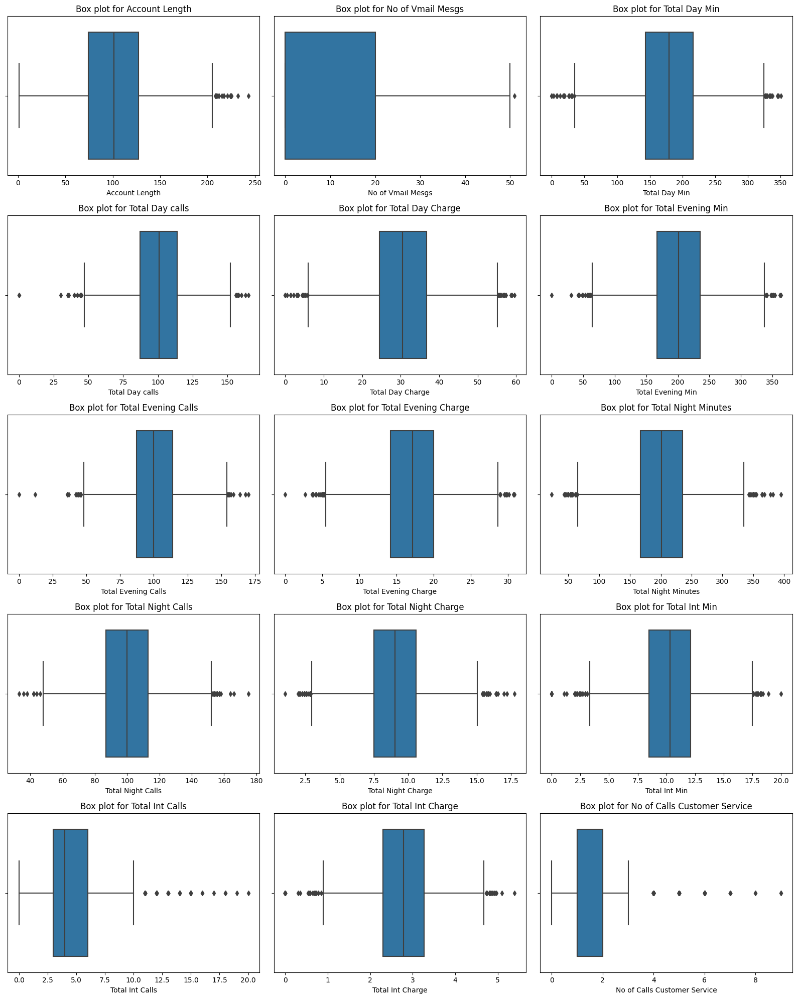

In [17]:
#Determine any outlier values(records)for numeric attributes and create box plots 



# Select numeric attributes
numeric_attributes = df.select_dtypes(include=['int64', 'float64']).columns

# Calculate the number of rows needed for the subplots

num_attributes = len(numeric_attributes)
num_rows = (num_attributes // 3) + (num_attributes % 3 > 0)

# Create box plots for numeric attributes

plt.figure(figsize=(16, 4 * num_rows))
for i, column in enumerate(numeric_attributes, 1):
    plt.subplot(num_rows, 3, i)
    sns.boxplot(x=df[column])
    plt.title(f'Box plot for {column}')

plt.tight_layout()
plt.show()


/Users/zhila/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/zhila/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/zhila/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/zhila/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conver

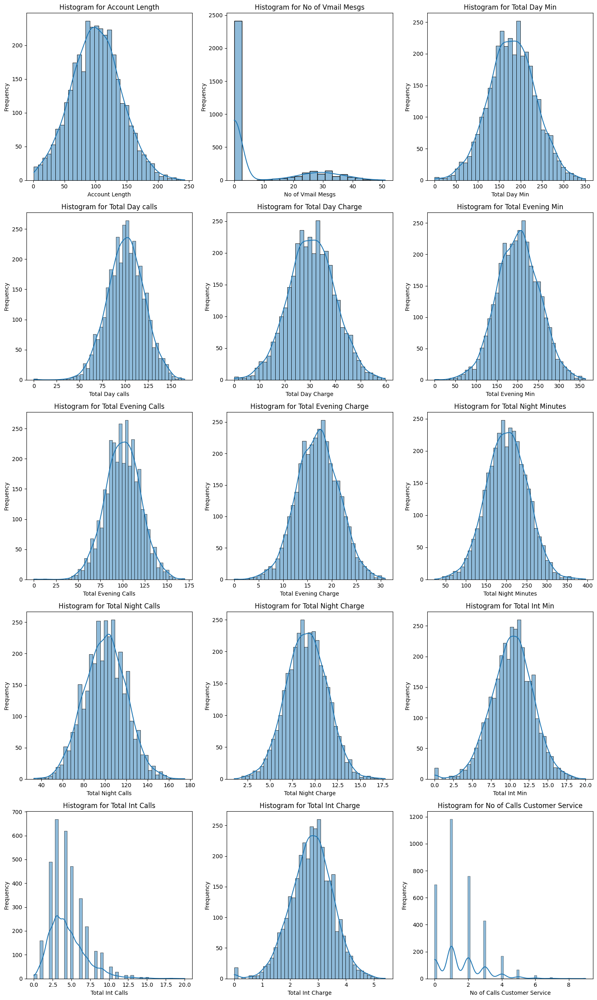

In [18]:
# To analyze the distribution of numeric attributes and create Histogram



num_attributes = len(numeric_attributes)


num_cols = 3  # Number of columns in the subplot grid
num_rows = (num_attributes // num_cols) + (num_attributes % num_cols > 0)

plt.figure(figsize=(15, 5 * num_rows))

# Plot histograms for numeric attributes

for i, column in enumerate(numeric_attributes, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Histogram for {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

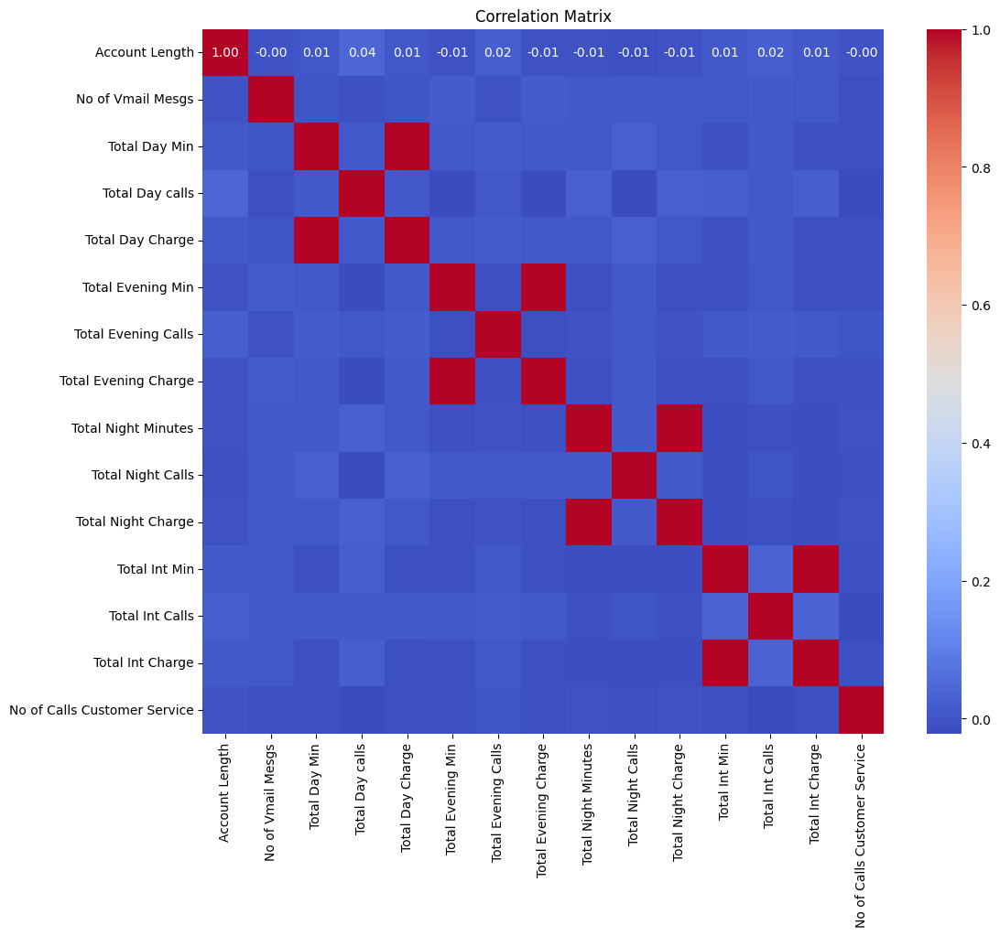

In [11]:
# Select only numerical columns
numeric_df = df.select_dtypes(include=['float64', 'int64'])

# Calculate correlation matrix
correlation_matrix = numeric_df.corr()

# Plot correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [18]:
####### Construct contingency table and perform chi-squared test to assess association between 'State' and 'Churn' variables



from scipy.stats import chi2_contingency

# Contingency table
contingency_table = pd.crosstab(df['State'], df['Churn'])

# Chi-squared test
chi2, p, _, _ = chi2_contingency(contingency_table)
print(f"Chi-squared p-value: {p}")

Chi-squared p-value: 0.002296221552011188


In [19]:
####  Determine whether the dataset has an imbalanced class distribution #####


# Check the class distribution of the target variable

class_distribution = df['Churn'].value_counts()

# Print the class distribution

print("Class Distribution:")

print(class_distribution)

# Check if the dataset has an imbalanced class distribution

is_imbalanced = class_distribution.nunique() > 1

# Print the result

if is_imbalanced:
    print("The dataset has an imbalanced class distribution.")
else:
    print("The dataset has a balanced class distribution.")


Class Distribution:
Churn
FALSE    2850
TRUE      483
Name: count, dtype: int64
The dataset has an imbalanced class distribution.


In [20]:
#Let's create a list for our categorical columns for  Churn data set 



cat_cols = ["State", "Area Code", "Phone Number", "Inter Plan", "VoiceMail Plan"]


# Create a copy of the data frame in memory with a different name
df_onehot = df.copy()

# Convert only categorical variables/features to dummy/one-hot features
df_onehot = pd.get_dummies(df_onehot, columns=cat_cols, prefix=cat_cols)

# Print the dataset
print(df_onehot)


# Create a copy of the data frame in memory with a different name
df_onehot=df.copy()

#convert only categorical variables/features to dummy/one-hot features
df_onehot = pd.get_dummies(df, columns=cat_cols, prefix = cat_cols)

#print the dataset
df_onehot


      Account Length  No of Vmail Mesgs  Total Day Min  Total Day calls  \
0              107.0               26.0          161.6            123.0   
1              137.0                0.0          243.4            114.0   
2               84.0                0.0          299.4             71.0   
3               75.0                0.0          166.7            113.0   
4              118.0                0.0          223.4             98.0   
...              ...                ...            ...              ...   
3328            68.0                0.0          231.1             57.0   
3329            28.0                0.0          180.8            109.0   
3330           184.0                0.0          213.8            105.0   
3331            74.0               25.0          234.4            113.0   
3332           128.0               25.0          265.1            110.0   

      Total Day Charge  Total Evening Min  Total Evening Calls  \
0                27.47           

,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,...,Phone Number_422-6690,Phone Number_422-7728,Phone Number_422-8268,Phone Number_422-8333,Phone Number_422-8344,Phone Number_422-9964,Inter Plan_no,Inter Plan_yes,VoiceMail Plan_no,VoiceMail Plan_yes
0,107.0,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,...,False,False,False,False,False,False,True,False,False,True
1,137.0,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,...,False,False,False,False,False,False,True,False,True,False
2,84.0,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,...,False,False,False,False,False,False,False,True,True,False
3,75.0,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,...,False,False,False,False,False,False,False,True,True,False
4,118.0,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,...,False,False,False,False,False,False,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,68.0,0.0,231.1,57.0,39.29,153.4,55.0,13.04,191.3,123.0,...,False,False,False,False,False,False,True,False,True,False
3329,28.0,0.0,180.8,109.0,30.74,288.8,58.0,24.55,191.9,91.0,...,False,False,False,False,False,False,True,False,True,False
3330,184.0,0.0,213.8,105.0,36.35,159.6,84.0,13.57,139.2,137.0,...,False,False,False,False,False,False,False,True,True,False
3331,74.0,25.0,234.4,113.0,39.85,265.9,82.0,22.60,241.4,77.0,...,False,False,False,False,False,False,True,False,False,True


In [21]:
#Repeat the train test set split

from sklearn.model_selection import train_test_split

class_col_name="Churn"
one_hot_feature_names=df_onehot.columns[df_onehot.columns != class_col_name]
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(df_onehot.loc[:, one_hot_feature_names], df_onehot[class_col_name], test_size=0.3,random_state=109) # 70% training and 30% test

In [22]:
# Repeat Naive Bayes modeling
from sklearn.naive_bayes import MultinomialNB

#Create a MultiNomial NB Classifier
nb = MultinomialNB()

#Train the model using the training sets
nb.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = nb.predict(X_test)
print ("Succesfully done..")

Succesfully done..


In [23]:
print("Number of features used ",nb.n_features_in_)
print("Classes ",nb.classes_)
print("Number of records for classes ",nb.class_count_)
print("Log prior probability for classes ", nb.class_log_prior_)
print("Log conditional probability for each feature given a class\n",nb.feature_log_prob_)

Number of features used  3406
Classes  ['FALSE' 'TRUE']
Number of records for classes  [2000.  333.]
Log prior probability for classes  [-0.15400781 -1.94676778]
Log conditional probability for each feature given a class
 [[-2.35240444 -4.81236658 -1.8039874  ... -9.66722848 -7.32471068
  -8.18058615]
 [-2.38746885 -5.36209714 -1.70638185 ... -8.24401576 -7.2151181
  -8.7786926 ]]


In [23]:
from sklearn.metrics import confusion_matrix
cf=confusion_matrix(y_test, y_pred)
print ("Confusion Matrix")
print(cf)
tn, fp, fn, tp=cf.ravel()
print ("TP: ", tp,", FP: ", fp,", TN: ", tn,", FN:", fn)

Confusion Matrix
[[758  92]
 [ 84  66]]
TP:  66 , FP:  92 , TN:  758 , FN: 84


In [24]:
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       FALSE       0.90      0.89      0.90       850
        TRUE       0.42      0.44      0.43       150

    accuracy                           0.82      1000
   macro avg       0.66      0.67      0.66      1000
weighted avg       0.83      0.82      0.83      1000



class Names ['FALSE' 'TRUE']


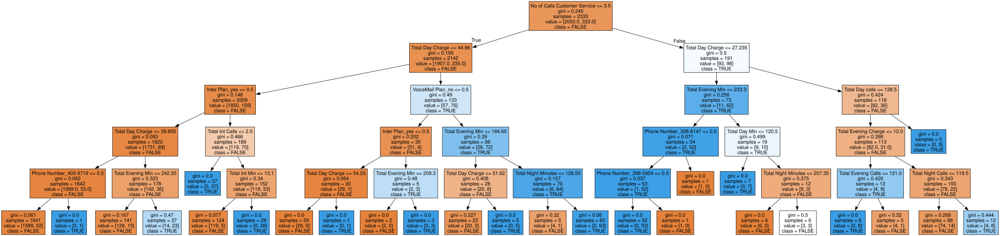

In [25]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_train)
import graphviz
#Get unique class values to display on the tree
class_values=df_onehot[class_col_name].unique()
print ("class Names",class_values)

dot_data = tree.export_graphviz(clf, out_file=None,
                                feature_names=one_hot_feature_names,
                                class_names=class_values,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png")
graph


In [26]:
# Perform prediction on the test set
y_pred = clf.predict(X_test)

In [27]:
# Get classification report
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       FALSE       0.94      0.98      0.96       850
        TRUE       0.83      0.64      0.72       150

    accuracy                           0.93      1000
   macro avg       0.88      0.81      0.84      1000
weighted avg       0.92      0.93      0.92      1000



In [28]:
from ydata_profiling import ProfileReport

# Generate the data profiling report
report = ProfileReport(df)
report


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]